<a href="https://colab.research.google.com/github/Hafsahhashmi/cmd/blob/main/Regression_pakwheel_Dataset.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Introduction / Dataset and its Objective**

**Dataset:**

The dataset pakwheels_used_cars.csv includes various features of second-hand cars listed on PakWheels, a prominent second-hand car-selling website. This dataset contains approximately more than 78,000 cars with 13 different features, along with their prices as the target variable.

**Objective:**

The objective of this analysis is to predict the prices of used cars listed on PakWheels based on the provided features using various regression algorithms. The goal is to identify the best-performing model based on key metrics such as Mean Absolute Error (MAE), Mean Squared Error (MSE), Root Mean Squared Error (RMSE), and R-squared (R²) score.

By exploring the dataset, handling missing values, transforming features, and applying regression algorithms, we aim to build a robust model that accurately predicts car prices. This analysis will help in understanding the key factors influencing car prices and can provide insights for buyers and sellers on the platform.

#**Step 1 : Data Cleaning And Preparation**

---



In [ ]:
import pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.multioutput import MultiOutputClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score, classification_report


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


**Loading data:**

In [ ]:
# Load the Regression dataset
Regression_data = pd.read_csv('/content/drive/MyDrive/Usedcar_Regression_dataset.csv')

<ipython-input-7-d535c25cf5ed>:2: DtypeWarning: Columns (0,5,6,7,8,12,13) have mixed types. Specify dtype option on import or set low_memory=False.
  Regression_data = pd.read_csv('/content/drive/MyDrive/Usedcar_Regression_dataset.csv')


In [ ]:
# Display the first few rows of the dataset
pd.set_option('display.max_columns', None)  # Ensure all columns are displayed
print("Regression Dataset:")
print(Regression_data.head().to_string(index=False))

Regression Dataset:
 addref     city assembly      body   make   model    year  engine transmission   fuel           color registered mileage      price
7943732 Peshawar      NaN     Sedan Toyota Corolla  2013.0  1300.0       Manual Petrol Silver Metallic     Lahore  145000  2870000.0
7730314   Lahore      NaN     Sedan  Honda    City  2000.0  1300.0       Manual Petrol            Blue     Lahore  230000   995000.0
7943737   Lahore      NaN     Sedan Toyota   Yaris  2021.0  1300.0       Manual Petrol     Super White     Punjab   60500  3585000.0
7943733   Lahore      NaN Hatchback Suzuki   Swift  2017.0  1300.0       Manual Petrol            Grey  Islamabad   87000  2250000.0
7923484   Lahore      NaN     Sedan  Honda   Civic  2017.0  1800.0    Automatic Petrol            Grey     Lahore   86000  4850000.0


**Handling missing values:**

Handled missing values by using mean imputation for numerical columns.

In [ ]:
# Display basic information about the dataset
Regression_data.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 155116 entries, 0 to 155115
Data columns (total 14 columns):
 #   Column        Non-Null Count   Dtype 
---  ------        --------------   ----- 
 0   addref        155116 non-null  object
 1   city          101855 non-null  object
 2   assembly      92562 non-null   object
 3   body          146212 non-null  object
 4   make          153606 non-null  object
 5   model         155114 non-null  object
 6   year          149403 non-null  object
 7   engine        155113 non-null  object
 8   transmission  155116 non-null  object
 9   fuel          154210 non-null  object
 10  color         153636 non-null  object
 11  registered    155116 non-null  object
 12  mileage       150395 non-null  object
 13  price         153884 non-null  object
dtypes: object(14)
memory usage: 16.6+ MB


In [ ]:
# Display the number of missing values in each column
missing_values = Regression_data.isnull().sum()
print("\nMissing Values:\n", missing_values)


Missing Values:
 addref              0
city            53261
assembly        62554
body             8904
make             1510
model               2
year             5713
engine              3
transmission        0
fuel              906
color            1480
registered          0
mileage          4721
price            1232
dtype: int64


In [ ]:
# Impute missing values for numerical columns with mean
for col in Regression_data.select_dtypes(include=['number']).columns:
    Regression_data[col].fillna(Regression_data[col].mean(), inplace=True)


In [ ]:
# Impute missing values for categorical columns with mode
for col in Regression_data.select_dtypes(include=['object']).columns:
    Regression_data[col].fillna(Regression_data[col].mode()[0], inplace=True)

In [ ]:
# Verify that there are no missing values left
print("\nMissing Values After Imputation:\n", Regression_data.isnull().sum())


Missing Values After Imputation:
 addref          0
city            0
assembly        0
body            0
make            0
model           0
year            0
engine          0
transmission    0
fuel            0
color           0
registered      0
mileage         0
price           0
dtype: int64


In [ ]:
from sklearn.preprocessing import LabelEncoder, StandardScaler

**Data Transformation:**

In [ ]:
# Convert categorical variables to numerical variables using Label Encoding
label_encoder = LabelEncoder()
for col in categorical_cols:
    # Ensure all values are strings before applying LabelEncoder
    Regression_data[col] = Regression_data[col].astype(str)
    Regression_data[col] = label_encoder.fit_transform(Regression_data[col])

**Feature and Target Separation:**

**Features**: All columns except the target columns.

**Target:** Extracted from label encoding columns.

In [ ]:
# Normalize/standardize the numerical features using StandardScaler
numerical_cols = Regression_data.select_dtypes(include=['number']).columns # Use Regression_data instead of df
scaler = StandardScaler()
Regression_data[numerical_cols] = scaler.fit_transform(Regression_data[numerical_cols]) # Use Regression_data instead of df

In [ ]:
print("\nColumn Names in Transformed Dataset:")
print(Regression_data.columns)



Column Names in Transformed Dataset:
Index(['addref', 'city', 'assembly', 'body', 'make', 'model', 'year', 'engine',
       'transmission', 'fuel', 'color', 'registered', 'mileage', 'price'],
      dtype='object')


**Data Splitting:**

In [ ]:
# Assuming the target variable is 'price'
X = Regression_data.drop('price', axis=1)
y = Regression_data['price']

In [ ]:
# Import necessary library
from sklearn.model_selection import train_test_split

# Split the data into training and testing sets using an 80-20 split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [ ]:
# Print shapes of the splits to verify
print(f"Training features shape: {X_train.shape}")
print(f"Testing features shape: {X_test.shape}")
print(f"Training target shape: {y_train.shape}")
print(f"Testing target shape: {y_test.shape}")

Training features shape: (124092, 13)
Testing features shape: (31024, 13)
Training target shape: (124092,)
Testing target shape: (31024,)


# **Step 2 : Data Analysis And Visualization**

---



**Creating summary**

In [ ]:
# Generate summary statistics
print(Regression_data.describe())

             addref          city      assembly          body          make  \
count  1.551160e+05  1.551160e+05  1.551160e+05  1.551160e+05  1.551160e+05   
mean  -1.172664e-16 -6.449652e-17  1.172664e-16  1.788313e-16  7.842190e-17   
std    1.000003e+00  1.000003e+00  1.000003e+00  1.000003e+00  1.000003e+00   
min   -1.757972e+00 -2.169491e+00 -2.395015e+00 -2.184689e+00 -2.325853e+00   
25%   -8.399518e-01 -1.003549e+00 -1.055878e+00 -1.006630e+00 -8.284458e-01   
50%   -1.086047e-03 -3.421005e-01  1.344658e-01 -1.321947e-01  5.844923e-01   
75%    8.465137e-01  1.182594e+00  1.027224e+00  1.045864e+00  7.841466e-01   
max    1.882780e+00  1.182594e+00  1.027224e+00  1.689546e+00  1.122023e+00   

              model          year        engine  transmission          fuel  \
count  1.551160e+05  1.551160e+05  1.551160e+05  1.551160e+05  1.551160e+05   
mean  -7.622316e-17  2.521227e-16  1.348564e-16 -2.345328e-17 -1.377880e-16   
std    1.000003e+00  1.000003e+00  1.000003e+00  1.

In [ ]:
# Identify any patterns, correlations, or anomalies in the data
print(Regression_data.corr())

                addref      city  assembly      body      make     model  \
addref        1.000000 -0.025964  0.060938  0.022032  0.023168  0.083535   
city         -0.025964  1.000000 -0.226618 -0.138631 -0.020963 -0.459224   
assembly      0.060938 -0.226618  1.000000  0.086624  0.049028  0.243333   
body          0.022032 -0.138631  0.086624  1.000000 -0.009133  0.175777   
make          0.023168 -0.020963  0.049028 -0.009133  1.000000  0.135579   
model         0.083535 -0.459224  0.243333  0.175777  0.135579  1.000000   
year         -0.064429  0.326296 -0.184293 -0.259753 -0.106647 -0.567017   
engine       -0.096699  0.438485 -0.389652 -0.293224 -0.104542 -0.764193   
transmission  0.086492 -0.354936  0.260549  0.206796  0.113511  0.675867   
fuel          0.043405 -0.369435  0.119228  0.123290  0.039030  0.385477   
color         0.004605 -0.082018  0.066177  0.016195  0.052580  0.118832   
registered    0.048561 -0.057844  0.133038  0.118957  0.082183  0.445188   
mileage     

**Visualization**

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

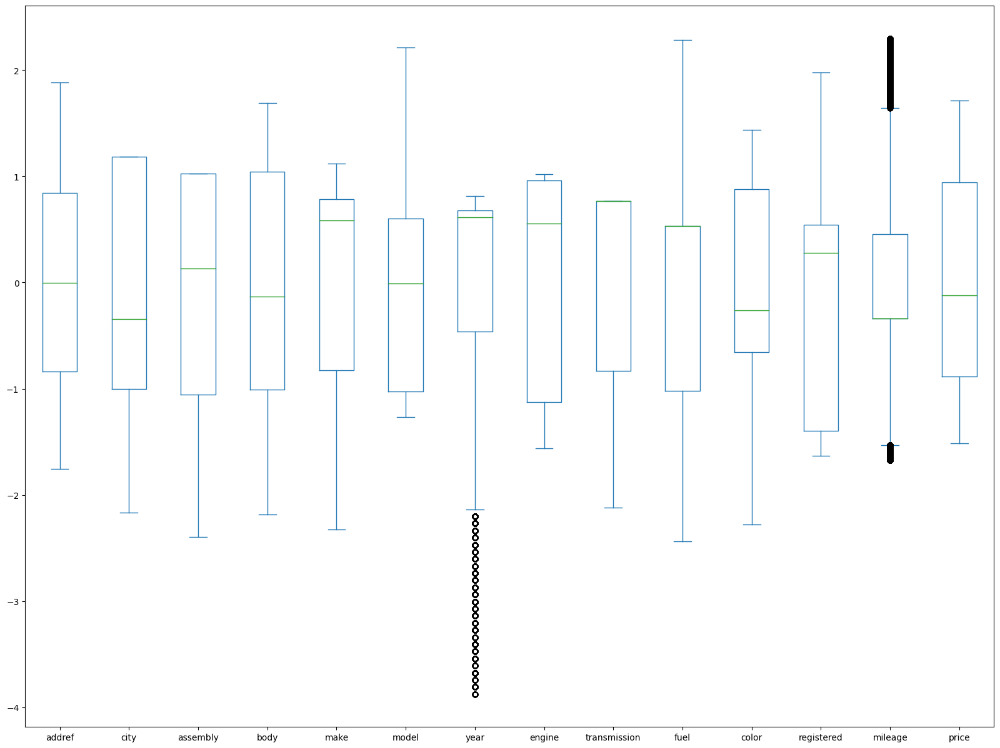

In [ ]:
# Box Plots
Regression_data.plot(kind='box', figsize=(20, 15))
plt.show()

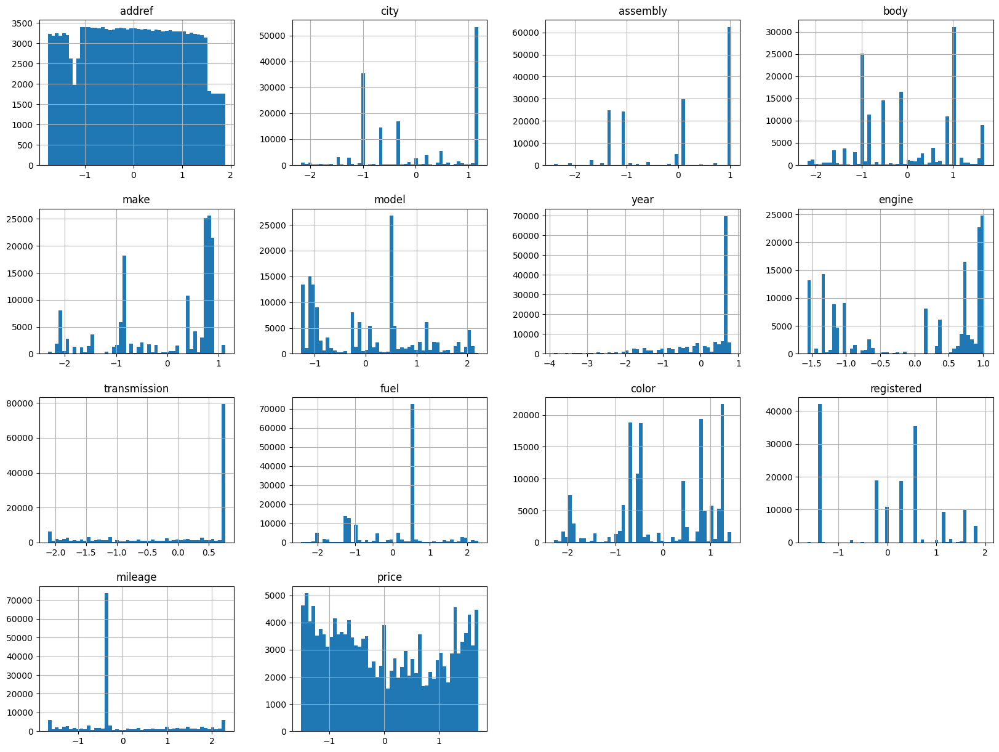

In [ ]:
# Histograms
Regression_data.hist(bins=50, figsize=(20, 15))
plt.show()

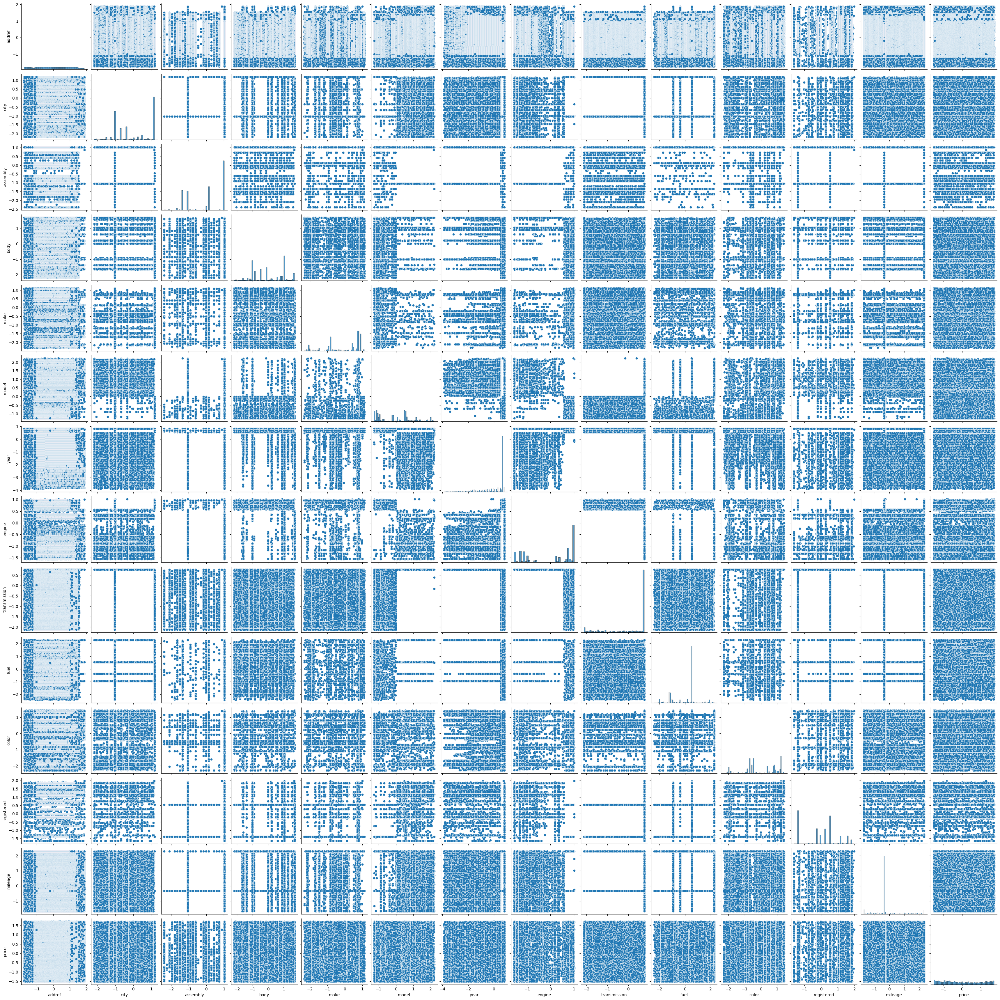

In [ ]:
# Scatter Plots
sns.pairplot(Regression_data)
plt.show()

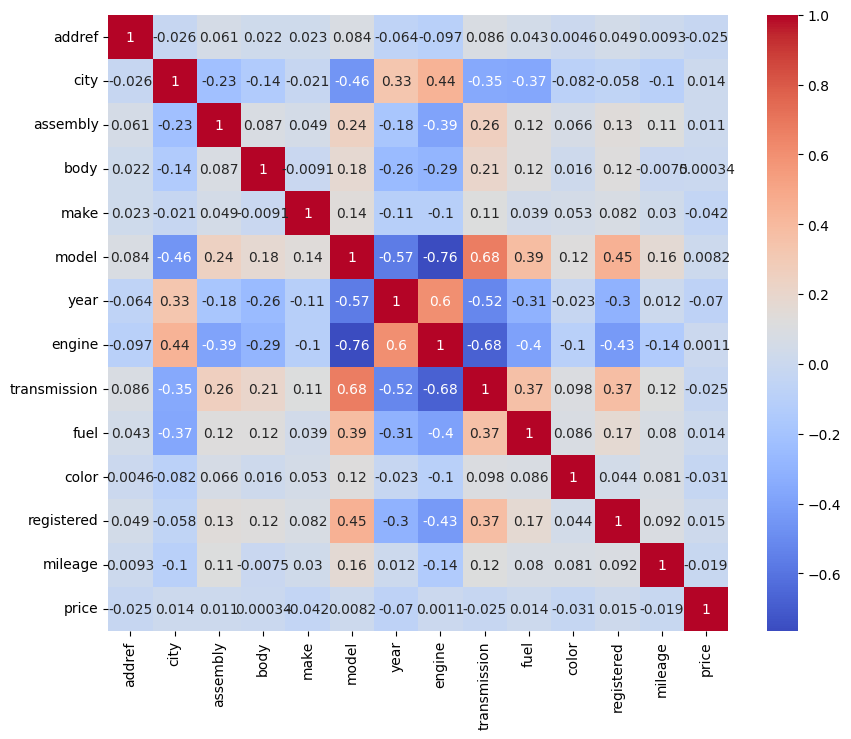

In [ ]:

# Correlation Heatmaps
plt.figure(figsize=(10, 8))
sns.heatmap(Regression_data.corr(), annot=True, cmap='coolwarm')
plt.show()

# **Step 3 : Machine Learning Models Regression**

---



Following three regression models are likely to yield the best results:

## **Random Forest Regression:**

**Why i choose this:**

Random Forest Regression is robust and can handle both numerical and categorical data well. It captures non-linear relationships and interactions between features without much preprocessing.

## **Gradient Boosting Regression (e.g., XGBoost, LightGBM):**

**Why i choose this:**

Gradient Boosting models, especially implementations like XGBoost or LightGBM, are very powerful for structured data and can handle complex patterns and interactions between features. They are known for their high predictive accuracy.

## **Linear Regression**

**Why i choose this: **

Choose Linear Regression for its simplicity and interpretability, making it easy to implement and understand relationships between variables. It's computationally efficient and serves as a solid baseline model for comparison with more complex methods.

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error

In [ ]:
# Load the Regression dataset
Regression_data = pd.read_csv('/content/drive/MyDrive/Usedcar_Regression_dataset.csv')

<ipython-input-23-d535c25cf5ed>:2: DtypeWarning: Columns (0,5,6,7,8,12,13) have mixed types. Specify dtype option on import or set low_memory=False.
  Regression_data = pd.read_csv('/content/drive/MyDrive/Usedcar_Regression_dataset.csv')


In [ ]:
# Display the number of missing values in each column
missing_values = Regression_data.isnull().sum()
print("\nMissing Values:\n", missing_values)


Missing Values:
 addref              0
city            53261
assembly        62554
body             8904
make             1510
model               2
year             5713
engine              3
transmission        0
fuel              906
color            1480
registered          0
mileage          4721
price            1232
dtype: int64


In [ ]:
# Impute missing values for numerical columns with mean
for col in Regression_data.select_dtypes(include=['number']).columns:
    Regression_data[col].fillna(Regression_data[col].mean(), inplace=True)


In [ ]:
# Impute missing values for categorical columns with mode
for col in Regression_data.select_dtypes(include=['object']).columns:
    Regression_data[col].fillna(Regression_data[col].mode()[0], inplace=True)

In [ ]:
# Verify that there are no missing values left
print("\nMissing Values After Imputation:\n", Regression_data.isnull().sum())


Missing Values After Imputation:
 addref          0
city            0
assembly        0
body            0
make            0
model           0
year            0
engine          0
transmission    0
fuel            0
color           0
registered      0
mileage         0
price           0
dtype: int64


In [ ]:
from sklearn.preprocessing import LabelEncoder, StandardScaler

In [ ]:
# Convert categorical variables to numerical variables using Label Encoding
label_encoder = LabelEncoder()
categorical_cols = Regression_data.select_dtypes(include=['object']).columns # Define categorical_cols

for col in categorical_cols:
    # Ensure all values are strings before applying LabelEncoder
    Regression_data[col] = Regression_data[col].astype(str)
    Regression_data[col] = label_encoder.fit_transform(Regression_data[col])

In [ ]:
# Normalize/standardize the numerical features using StandardScaler
numerical_cols = Regression_data.select_dtypes(include=['number']).columns # Use Regression_data instead of df
scaler = StandardScaler()
Regression_data[numerical_cols] = scaler.fit_transform(Regression_data[numerical_cols]) # Use Regression_data instead of df

In [ ]:
print("\nColumn Names in Transformed Dataset:")
print(Regression_data.columns)


Column Names in Transformed Dataset:
Index(['addref', 'city', 'assembly', 'body', 'make', 'model', 'year', 'engine',
       'transmission', 'fuel', 'color', 'registered', 'mileage', 'price'],
      dtype='object')


In [ ]:
# Assuming the target variable is 'price'
X = Regression_data.drop('price', axis=1)
y = Regression_data['price']

In [ ]:
# Import necessary library
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor # Added import for RandomForestRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score # Added import for metrics

# Split the data into training and testing sets using an 80-20 split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [ ]:
#Import the necessary functions from scikit-learn
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

In [ ]:
# Print shapes of the splits to verify
print(f"Training features shape: {X_train.shape}")
print(f"Testing features shape: {X_test.shape}")
print(f"Training target shape: {y_train.shape}")
print(f"Testing target shape: {y_test.shape}")

Training features shape: (124092, 13)
Testing features shape: (31024, 13)
Training target shape: (124092,)
Testing target shape: (31024,)


**Random Forest Regressor:**

In [ ]:
# Model training
model = RandomForestRegressor(n_estimators=100, random_state=42)
model.fit(X_train, y_train)


RandomForestRegressor(random_state=42)

In [ ]:
# Predictions
y_pred = model.predict(X_test)

In [ ]:
# Evaluation metrics
mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
rmse = mse ** 0.5
r2 = r2_score(y_test, y_pred)

In [ ]:
print(f"Mean Absolute Error: {mae}")
print(f"Mean Squared Error: {mse}")
print(f"Root Mean Squared Error: {rmse}")
print(f"Random Forest R^2 Score: {r2}")

Mean Absolute Error: 0.39809641109309724
Mean Squared Error: 0.454788328959827
Root Mean Squared Error: 0.6743799588954487
Random Forest R^2 Score: 0.5462231501119624


**Gradient Boosting Regression (XGBoost):**

In [ ]:
# Install and import the XGBoost library
!pip install xgboost
import xgboost as xgb


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 190.9/190.9 MB 7.3 MB/s eta 0:00:00
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
torch 2.3.1+cu121 requires nvidia-cublas-cu12==12.1.3.1; platform_system == "Linux" and platform_machine == "x86_64", which is not installed.
torch 2.3.1+cu121 requires nvidia-cuda-cupti-cu12==12.1.105; platform_system == "Linux" and platform_machine == "x86_64", which is not installed.
torch 2.3.1+cu121 requires nvidia-cuda-nvrtc-cu12==12.1.105; platform_system == "Linux" and platform_machine == "x86_64", which is not installed.
torch 2.3.1+cu121 requires nvidia-cuda-runtime-cu12==12.1.105; platform_system == "Linux" and platform_machine == "x86_64", which is not installed.
torch 2.3.1+cu121 requires nvidia-cudnn-cu12==8.9.2.26; platform_system == "Linux" and platform_machine == "x86_64", which is not installed.
torch 2.3.1+cu121 requ

In [ ]:
# Model training
model = xgb.XGBRegressor(n_estimators=100, learning_rate=0.1, max_depth=5, random_state=42)
model.fit(X_train, y_train)


XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=0.1, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=5, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=100, n_jobs=None,
             num_parallel_tree=None, random_state=42, ...)

In [ ]:
# Predictions
y_pred = model.predict(X_test)

In [ ]:
# Evaluation metrics
mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
rmse = mse ** 0.5
r2 = r2_score(y_test, y_pred)

In [ ]:
print(f"XGBoost Mean Absolute Error: {mae}")
print(f"XGBoost Mean Squared Error: {mse}")
print(f"XGBoost Root Mean Squared Error: {rmse}")
print(f"XGBoost R^2 Score: {r2}")

XGBoost Mean Absolute Error: 0.5262212827209701
XGBoost Mean Squared Error: 0.5580692717394321
XGBoost Root Mean Squared Error: 0.7470403414404285
XGBoost R^2 Score: 0.443171910922982


**Linear Regression**

In [ ]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

In [ ]:
# Initialize the model
linear_reg = LinearRegression()


In [ ]:
# Train the model
linear_reg.fit(X_train, y_train)

LinearRegression()

In [ ]:
# Make predictions
linear_pred = linear_reg.predict(X_test)

In [ ]:
# Evaluate the model
lr_mae = mean_absolute_error(y_test, linear_pred)
lr_mse = mean_squared_error(y_test, linear_pred)
lr_rmse = lr_mse ** 0.5
lr_r2 = r2_score(y_test, linear_pred)

In [ ]:
# Print evaluation metrics
print("Linear Regression MAE:", lr_mae)
print("Linear Regression MSE:", lr_mse)
print("Linear Regression RMSE:", lr_rmse)
print("Linear Regression R^2:", lr_r2)

Linear Regression MAE: 0.8363082222112946
Linear Regression MSE: 0.9862039027385207
Linear Regression RMSE: 0.9930779942877199
Linear Regression R^2: 0.015989479423283326


**Explanation of Metrics**

**Mean Absolute Error (MAE):**  

The average absolute difference between the predicted values and the actual values.

**Mean Squared Error (MSE):**

 The average of the squares of the differences between predicted and actual values.

**Root Mean Squared Error (RMSE):**

 The square root of MSE.

**R^2 Score:**

Represents the proportion of variance in the dependent variable that is predictable from the independent variables.

# **4. Model Evaluation and Comparison:**

---

In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
from xgboost import XGBRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
import matplotlib.pyplot as plt
import seaborn as sns


In [ ]:
# Initialize the models
linear_reg = LinearRegression()
random_forest = RandomForestRegressor(n_estimators=100, random_state=42)
xgboost = XGBRegressor(n_estimators=100, learning_rate=0.1, random_state=42)

In [ ]:
# Train the models
linear_reg.fit(X_train, y_train)
random_forest.fit(X_train, y_train)
xgboost.fit(X_train, y_train)

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=0.1, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=None, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=100, n_jobs=None,
             num_parallel_tree=None, random_state=42, ...)

In [ ]:
# Make predictions
linear_pred = linear_reg.predict(X_test)
rf_pred = random_forest.predict(X_test)
xgb_pred = xgboost.predict(X_test)

**Evaluate the Models**

In [ ]:
# Evaluation metrics
def evaluate_model(y_true, y_pred):
    mae = mean_absolute_error(y_true, y_pred)
    mse = mean_squared_error(y_true, y_pred)
    rmse = np.sqrt(mse)
    r2 = r2_score(y_true, y_pred)
    return mae, mse, rmse, r2

# Linear Regression
lr_mae, lr_mse, lr_rmse, lr_r2 = evaluate_model(y_test, linear_pred)
# Random Forest
rf_mae, rf_mse, rf_rmse, rf_r2 = evaluate_model(y_test, rf_pred)
# XGBoost
xgb_mae, xgb_mse, xgb_rmse, xgb_r2 = evaluate_model(y_test, xgb_pred)

**Creating Summary**

In [ ]:
# Create a DataFrame with performance metrics
performance_df = pd.DataFrame({
    'Model': ['Linear Regression', 'Random Forest', 'XGBoost'], # Removed LightGBM and SVR
    'MAE': [lr_mae, rf_mae, xgb_mae], # Removed LightGBM and SVR metrics
    'MSE': [lr_mse, rf_mse, xgb_mse], # Removed LightGBM and SVR metrics
    'RMSE': [lr_rmse, rf_rmse, xgb_rmse], # Removed LightGBM and SVR metrics
    'R^2': [lr_r2, rf_r2, xgb_r2] # Removed LightGBM and SVR metrics
})

In [ ]:
print(performance_df)

               Model       MAE       MSE      RMSE       R^2
0  Linear Regression  0.836308  0.986204  0.993078  0.015989
1      Random Forest  0.398096  0.454788  0.674380  0.546223
2            XGBoost  0.495068  0.524747  0.724394  0.476420


**Visualize the Performance Metrics**

In [ ]:
# Melt the DataFrame for easier plotting
melted_df = performance_df.melt(id_vars='Model', var_name='Metric', value_name='Score')


In [ ]:
# Set up the matplotlib figure
plt.figure(figsize=(14, 8))

<Figure size 1400x800 with 0 Axes>

<Figure size 1400x800 with 0 Axes>

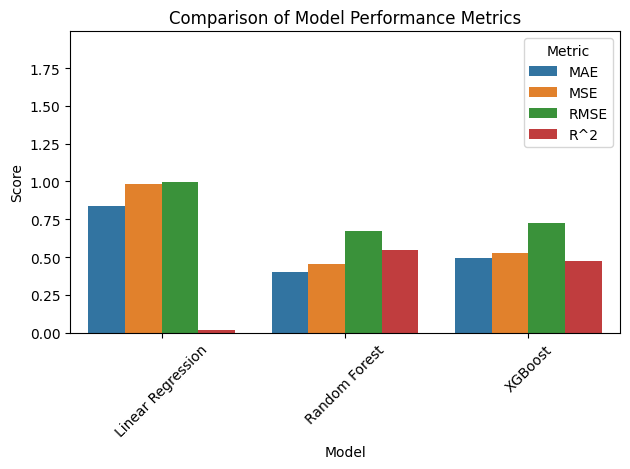

In [ ]:
# Create the barplot
sns.barplot(x='Model', y='Score', hue='Metric', data=melted_df)
plt.title('Comparison of Model Performance Metrics')
plt.xlabel('Model')
plt.ylabel('Score')
plt.ylim(0, max(melted_df['Score']) + 1)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

**Comparison Between Linear Regression, Random Forest, and XGBoost**

**Linear Regression:**

Simple and interpretable.

Efficient but assumes linear relationships.

**Random Forest:**

Handles non-linear relationships well.

Robust performance, less interpretable.

**XGBoost:**

Captures complex patterns.

Typically best performance, but computationally intensive.